## _*Quantum Shots Animator*_ 

The latest version of this notebook is available on xxxxxxxxxx.

***
### Contributors
Tea Vui Huang

### Introduction
**Qiskit-Shots-Animator** (https://pypi.org/project/qiskit-shots-animator) animates microwave-pulse shots in a quantum circuit execution as microwave flashes either on a gate map, or x-ray photo of the quantum computer chip. Microwave measurement pulses interact with qubits via readout resonators and are reflected back, the animation illustrates readout microwave (MW) pulses at the corresponding Rx read-out resonators

In [ ]:
# Install the python package 'qiskit-shots-animator'
!pip install qiskit-shots-animator

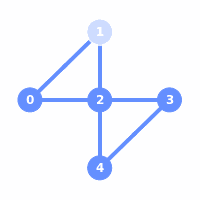

     ┌───┐                          ┌───┐┌─┐         
q_0: ┤ X ├──────────────────────────┤ H ├┤M├─────────
     └─┬─┘                     ┌───┐└─┬─┘└╥┘┌─┐      
q_1: ──■───────────────────────┤ X ├──┼───╫─┤M├──────
       │          ┌───┐        └─┬─┘  │   ║ └╥┘┌─┐   
q_2: ──┼──────────┤ H ├──────────┼────■───╫──╫─┤M├───
       │  ┌───────┴───┴───────┐  │   ┌─┐  ║  ║ └╥┘   
q_3: ──■──┤ U2(1.0746,4.2901) ├──┼───┤M├──╫──╫──╫────
     ┌───┐└───────────────────┘  │   └╥┘  ║  ║  ║ ┌─┐
q_4: ┤ Z ├───────────────────────■────╫───╫──╫──╫─┤M├
     └───┘                            ║   ║  ║  ║ └╥┘
c: 5/═════════════════════════════════╩═══╩══╩══╩══╩═
                                      3   0  1  2  4 


In [7]:
import qiskit.tools.jupyter
from qiskit import IBMQ, QuantumCircuit, Aer, execute
from qiskit.circuit.random import random_circuit
from IPython.core.display import display, Image
from qiskit_shots_animator.visualization import save_quantum_animation, get_sample, get_supported_samples

# Generate and execute a random-circuit locally on Qiskit-Aer backend
backend = Aer.get_backend('qasm_simulator')
while(1):
    circ = random_circuit(5, 2, max_operands=3, measure=True)
    counts = execute(circ, backend, shots=1000).result().get_counts()
    # Select a circuit with non-static output
    if len(counts)>4: break    
        
# Save & display animation of quantum circuit execution
# running at 5 shots-per-second on auto-selected sample
filename = "quantum-shots_5q.gif"
save_quantum_animation(filename, "gate", 5, counts, get_sample(backend, circ))
img = Image(filename); img.reload(); display(img)
print(circ.draw())

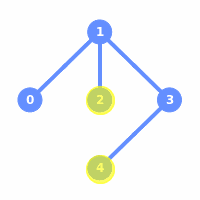

In [8]:
# Save & display animation of quantum circuit execution 
# running at 3 shots-per-second on 'giraffe' sample
filename = "quantum-shots_5q_giraffe.gif"
save_quantum_animation(filename, "gate", 3, counts, "giraffe", 
                      microwave_color="yellow", microwave_intensity=0.6) 
img = Image(filename); img.reload(); display(img)

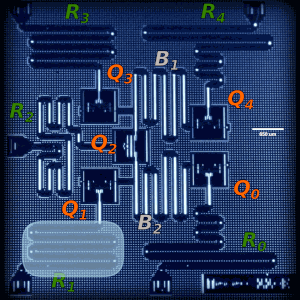

In [9]:
# Save & display animation of quantum circuit execution 
# running at 3 shots-per-second on a labelled X-ray sample
filename = "quantum-shots_5q_sparrow_xray-labelled.gif"
save_quantum_animation(filename, "xray", 3, counts, get_sample(backend, circ), labelled=True,
                      microwave_color="lightblue", microwave_intensity=0.6)
img = Image(filename); img.reload(); display(img)

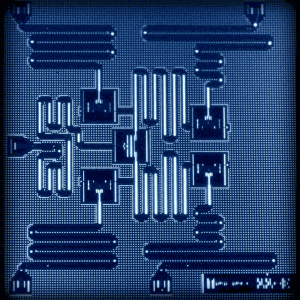

In [10]:
# Save & display animation of quantum circuit execution 
# running at 3 shots-per-second on an unlabelled X-ray sample
filename = "quantum-shots_5q_sparrow_xray-unlabelled.gif"
save_quantum_animation(filename, "xray", 3, counts, get_sample(backend, circ), labelled=False,
                      microwave_color="white", microwave_intensity=0.5)
img = Image(filename); img.reload(); display(img)

In [ ]:
# Save & display animation of quantum circuit execution 
# running at 3 shots-per-second on all supported samples
for sample in get_supported_samples():
    print(sample); filename = "quantum-shots_5q_" + sample + ".gif"
    if (save_quantum_animation(filename, "gate", 3, counts, sample)== True):
        img = Image(filename); img.reload(); display(img)        

In [12]:
%qiskit_version_table